In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dataset/order_data_last_six_month.xlsx - Worksheet.csv
/kaggle/input/dataset/associated_order_item_data_last_six_month.xlsx - Worksheet.csv


In [2]:
df_order = pd.read_csv('/kaggle/input/dataset/order_data_last_six_month.xlsx - Worksheet.csv')
df_associated_order = pd.read_csv('/kaggle/input/dataset/associated_order_item_data_last_six_month.xlsx - Worksheet.csv')

In [3]:
df_order_merge = df_order.drop(columns = ['amount', 'discount' ,'net_order_amount' ,'profit'])

In [4]:
df_order_merge

,order_date,order_id,order_number,customer_id,customer_name,poc_name,poc_id,order_status,warehouse_name,warehouse_id
0,03/04/2025,136349,SO/25-26/000818,5235,Anshu General Store Sector 34,Vikas Gupta,6,CLOSED,Noida,3
1,30/01/2025,110393,SO/24-25/90881,7622,bhai di rasoi,Abhay Srimali,7814,CLOSED,Greater NOIDA,6
2,12/02/2025,116427,SO/24-25/96511,3827,Shama chicken corner beta,Yash Pandey,51,CLOSED,Noida,3
3,26/12/2024,96182,SO/24-25/77411,2223,Bikaner Sweets ( Harola ),Swatantra,25,CLOSED,Noida,3
4,30/12/2024,97858,SO/24-25/78975,6903,Lucknow kirana store,Raj Kumar,7039,CLOSED,Gomti Nagar,1
...,...,...,...,...,...,...,...,...,...,...
64454,26/12/2024,96152,SO/24-25/77382,948,Maa Bindwa,Utkarsh Pratap Singh,17,CLOSED,Gomti Nagar,1
64455,26/12/2024,96153,SO/24-25/77392,5822,Yaduvanshi General Store,Raza Rizvi,5602,CLOSED,Telibagh,2
64456,25/12/2024,96166,SO/24-25/77390,1655,Brijwasi sweet and restaurant (115),Ashutosh Tripathi,37,CLOSED,Noida,3
64457,26/12/2024,96173,SO/24-25/77401,4268,Ashutosh Traders,Mohd Yaqoob,4293,CLOSED,Telibagh,2


In [5]:
df_associated_order

,order_id,order_number,order_item_id,item_name,quantity,invoiced_quantity,mrp,price_per_unit,amount,discount_amount,profit
0,104592,SO/24-25/85358,202967,Anannya Rice,2,2,1732.000,1534.0,3464.00,396.00,-208.00
1,74112,SO/24-25/55656,148560,Ambey Patent Maida,1,1,1899.000,1760.0,1899.00,139.00,-10.00
2,105873,SO/24-25/86555,205222,Arhar Dal,10,0,173.567,127.0,1735.67,465.67,-377.00
3,112302,SO/24-25/92717,216104,Kezar Maida,5,5,1760.000,1652.0,8800.00,540.00,-140.00
4,74308,SO/24-25/55887,148902,Normal Sugar,1,1,2190.000,2110.0,2190.00,80.00,40.00
...,...,...,...,...,...,...,...,...,...,...,...
115088,139435,SO/25-26/003737,262494,SAPNA GOLD AATA,2,0,2010.000,1470.0,4020.00,1080.00,-780.00
115089,139433,SO/25-26/003738,262491,Hum Tum Rice,5,0,1390.000,1215.0,6950.00,875.00,-375.00
115090,139431,SO/25-26/003739,262489,Masodha Double Filter Sugar,4,0,2430.000,2210.0,9720.00,880.00,-160.00
115091,139430,SO/25-26/003740,262488,Matar,10,0,54.675,45.0,546.75,96.75,-56.75


In [6]:
df_merged = pd.merge(df_associated_order, df_order_merge, on='order_id', how='inner')
df_merged.drop(columns = ['order_number_x'], inplace = True)

In [7]:
df_merged.drop(columns = ['order_number_y'], inplace = True)

In [8]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115093 entries, 0 to 115092
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   order_id           115093 non-null  int64  
 1   order_item_id      115093 non-null  int64  
 2   item_name          115093 non-null  object 
 3   quantity           115093 non-null  int64  
 4   invoiced_quantity  115093 non-null  int64  
 5   mrp                115093 non-null  float64
 6   price_per_unit     115093 non-null  float64
 7   amount             115093 non-null  float64
 8   discount_amount    115093 non-null  float64
 9   profit             115093 non-null  float64
 10  order_date         115093 non-null  object 
 11  customer_id        115093 non-null  int64  
 12  customer_name      115093 non-null  object 
 13  poc_name           115093 non-null  object 
 14  poc_id             115093 non-null  int64  
 15  order_status       115093 non-null  object 
 16  wa

In [9]:
df_merged['order_date'] = pd.to_datetime(df_merged['order_date'])

/tmp/ipykernel_13/3880002550.py:1: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_merged['order_date'] = pd.to_datetime(df_merged['order_date'])


In [10]:
df_merged

,order_id,order_item_id,item_name,quantity,invoiced_quantity,mrp,price_per_unit,amount,discount_amount,profit,order_date,customer_id,customer_name,poc_name,poc_id,order_status,warehouse_name,warehouse_id
0,104592,202967,Anannya Rice,2,2,1732.000,1534.0,3464.00,396.00,-208.00,2025-01-16,5980,AGRAWAL TRADERS,Support Team,5381,CLOSED,Telibagh,2
1,74112,148560,Ambey Patent Maida,1,1,1899.000,1760.0,1899.00,139.00,-10.00,2024-10-22,5540,Ramesh tiffin Sarvice,Anmol Mishra,4680,CLOSED,Noida,3
2,105873,205222,Arhar Dal,10,0,173.567,127.0,1735.67,465.67,-377.00,2025-01-19,1119,Prashsti General Store,Support Team,5381,CLOSED,Telibagh,2
3,112302,216104,Kezar Maida,5,5,1760.000,1652.0,8800.00,540.00,-140.00,2025-02-04,3776,Bheem General Store ( Ahmamau),Sumit Mishra,43,CLOSED,Gomti Nagar,1
4,74308,148902,Normal Sugar,1,1,2190.000,2110.0,2190.00,80.00,40.00,2024-10-22,5569,AKMK GENERAL STORE,Raza Rizvi,5602,CLOSED,Telibagh,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115088,139435,262494,SAPNA GOLD AATA,2,0,2010.000,1470.0,4020.00,1080.00,-780.00,2025-04-10,7869,Rama bhojnalaya restaurant,Sahil Kumar,7228,OPEN,Ayodhya,4
115089,139433,262491,Hum Tum Rice,5,0,1390.000,1215.0,6950.00,875.00,-375.00,2025-04-10,7806,Shivang general Store,Sahil Kumar,7228,OPEN,Ayodhya,4
115090,139431,262489,Masodha Double Filter Sugar,4,0,2430.000,2210.0,9720.00,880.00,-160.00,2025-04-10,7806,Shivang general Store,Sahil Kumar,7228,OPEN,Ayodhya,4
115091,139430,262488,Matar,10,0,54.675,45.0,546.75,96.75,-56.75,2025-04-10,4982,Lucky Sweets,Sahil Kumar,7228,OPEN,Ayodhya,4


In [11]:
df_merged.nunique()

order_id              64459
order_item_id        115093
item_name               607
quantity                117
invoiced_quantity       128
mrp                    1992
price_per_unit         2216
amount                 8264
discount_amount        6429
profit                 4614
order_date              190
customer_id            4161
customer_name          4093
poc_name                 94
poc_id                   97
order_status              2
warehouse_name            6
warehouse_id              6
dtype: int64

In [12]:
#df_merged.to_csv('Merge_CSV.csv', index=False)

In [13]:
# Find names linked to multiple unique customer IDs
duplicate_names = df_order.groupby('customer_name')['customer_id'].nunique()
duplicate_names = duplicate_names[duplicate_names > 1]

print("Customers with same name but different IDs:\n")

for name in duplicate_names.index:
    ids = df_order[df_order['customer_name'] == name]['customer_id'].unique()
    print(f"{name} --> IDs: {list(ids)}")


Customers with same name but different IDs:

93 Bataliyan CRPF  --> IDs: [4386, 4141]
Ahmad Kirana Store  --> IDs: [4220, 41]
Anoop General Store  --> IDs: [5321, 5740]
Awasthi General Store --> IDs: [282, 9074]
Balaji Kirana Store --> IDs: [6725, 5486]
Balaji Sweets --> IDs: [2281, 311]
Bangali Sweets --> IDs: [4889, 3395]
CHAURASIYA GENERAL STORE  --> IDs: [7463, 5430]
Champaran Meat House --> IDs: [2296, 8862]
Deepak General Store --> IDs: [436, 5288]
GUPTA GENERAL STORE  --> IDs: [7406, 5252]
Guddu general Store  --> IDs: [8139, 8990]
Gupta General Store --> IDs: [6080, 3661, 656]
Gupta General Store  --> IDs: [6204, 6014, 6130]
Gupta Puri Bhandar --> IDs: [3372, 87]
Gupta sweet shop --> IDs: [1720, 2420]
Harsh General Store --> IDs: [5287, 6421]
Jagdeesh General Store  --> IDs: [5649, 5368]
Jaiswal General Store  --> IDs: [5552, 8671]
Jaiswal Kirana Store  --> IDs: [6284, 5986, 5979, 7885]
Janta Dhaba --> IDs: [7206, 5010]
Janta General Store  --> IDs: [776, 5617]
M/S SWAD DAIRY A

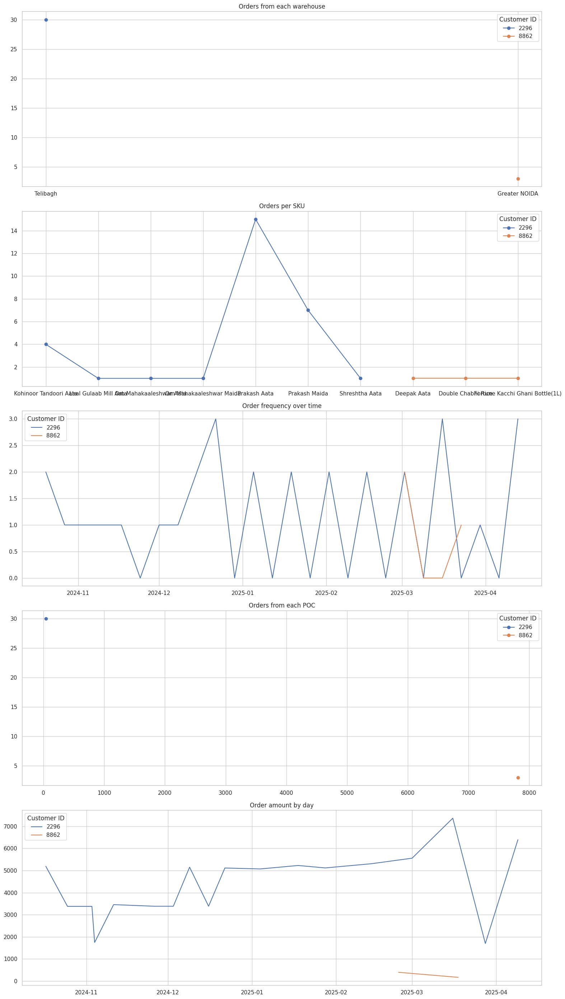

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sample: load your data
# df = pd.read_csv('your_data.csv')  # Or load from your actual source

# Example customer name
target_customer_name = "Anoop General Store"

# Filter customer_ids
#customer_ids = df_merged[df_merged['customer_name'] == target_customer_name]['customer_id'].unique()

customer_ids = [2296, 8862]

# Set style
sns.set(style='whitegrid')
fig, axes = plt.subplots(5, 1, figsize=(16, 28))

for customer_id in customer_ids:
    cust_df = df_merged[df_merged['customer_id'] == customer_id]

    # 1. Orders from each warehouse
    warehouse_counts = cust_df['warehouse_name'].value_counts()
    axes[0].plot(warehouse_counts.index, warehouse_counts.values, marker='o', label=str(customer_id))

    # 2. Orders per SKU over time
    sku_counts = cust_df.groupby('item_name').size()
    axes[1].plot(sku_counts.index, sku_counts.values, marker='o', label=str(customer_id))

    # 3. Order frequency over time
    freq = cust_df.resample('W', on='order_date').size()
    axes[2].plot(freq.index, freq.values, label=str(customer_id))

    # 4. Orders from each POC
    poc_counts = cust_df['poc_id'].value_counts()
    axes[3].plot(poc_counts.index, poc_counts.values, marker='o', label=str(customer_id))

    # 5. Order amount by day
    amount_by_day = cust_df.groupby(cust_df['order_date'].dt.date)['amount'].sum()
    axes[4].plot(amount_by_day.index, amount_by_day.values, label=str(customer_id))

# Set titles
axes[0].set_title("Orders from each warehouse")
axes[1].set_title("Orders per SKU")
axes[2].set_title("Order frequency over time")
axes[3].set_title("Orders from each POC")
axes[4].set_title("Order amount by day")

# Set legends
for ax in axes:
    ax.legend(title="Customer ID")

plt.tight_layout()
plt.show()


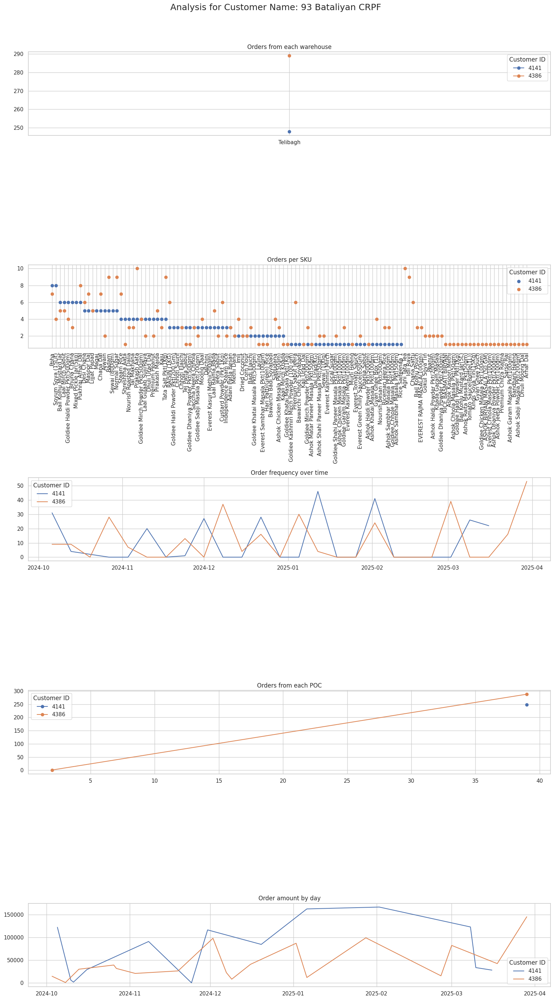

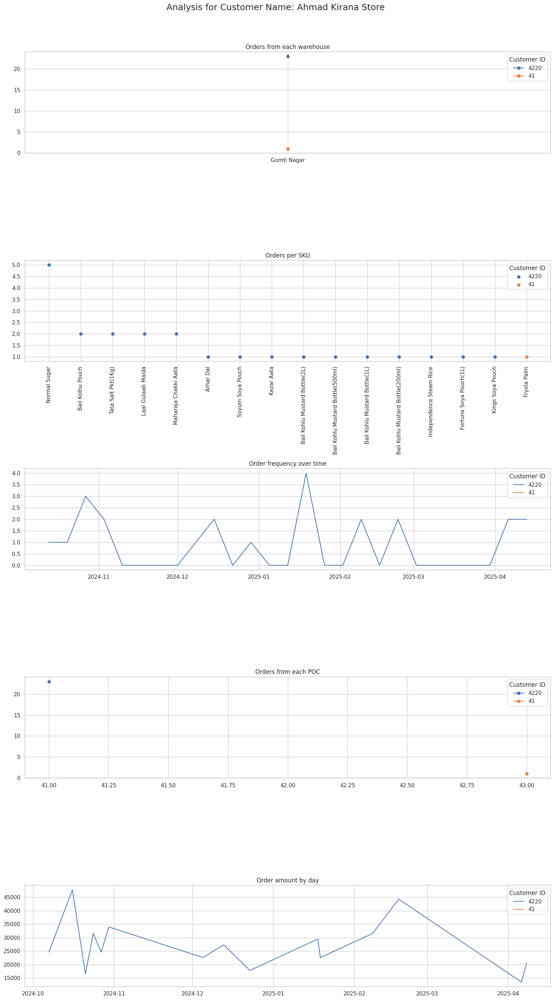

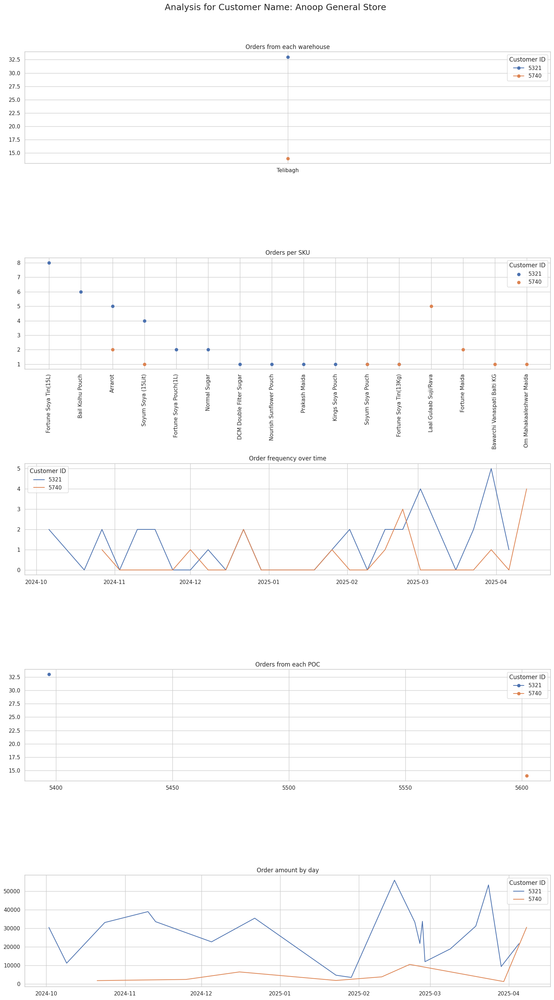

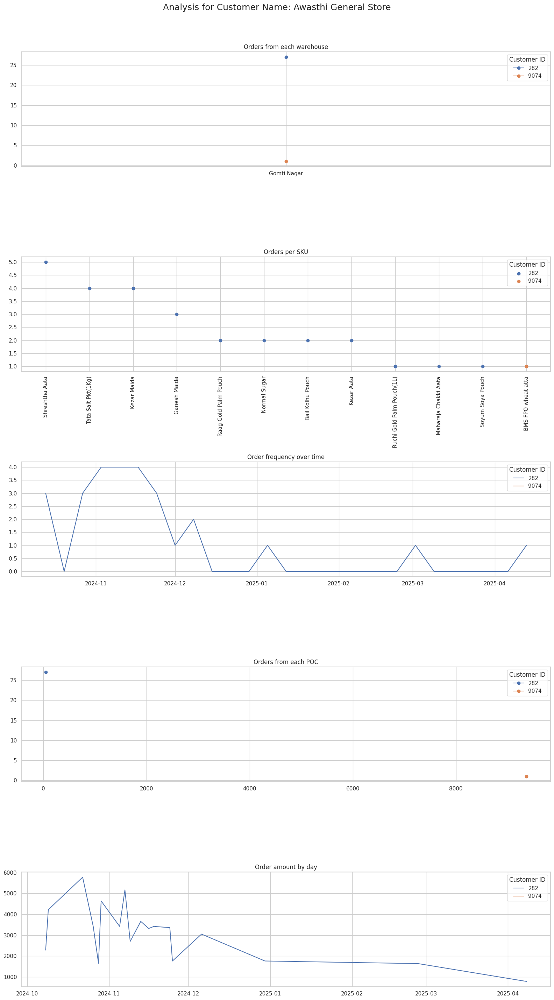

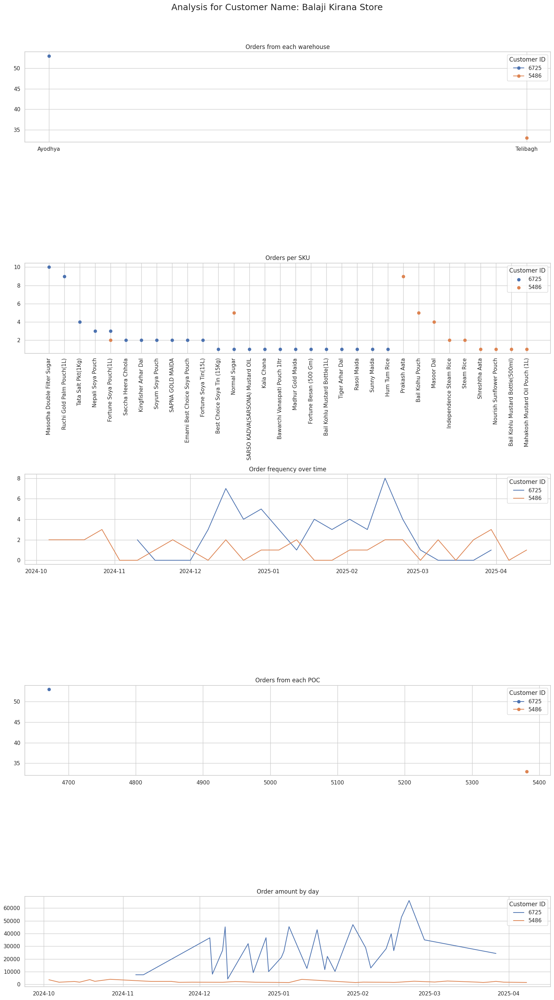

...

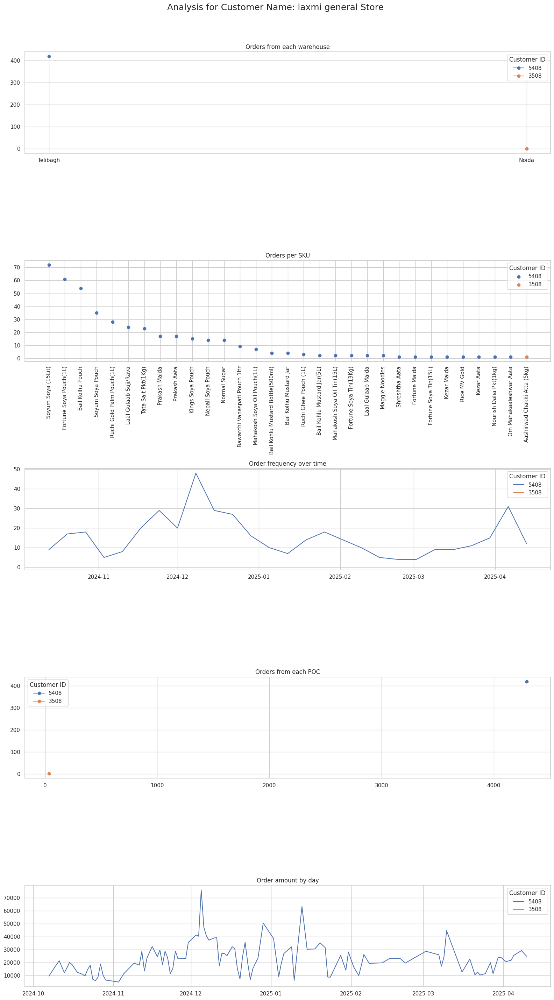

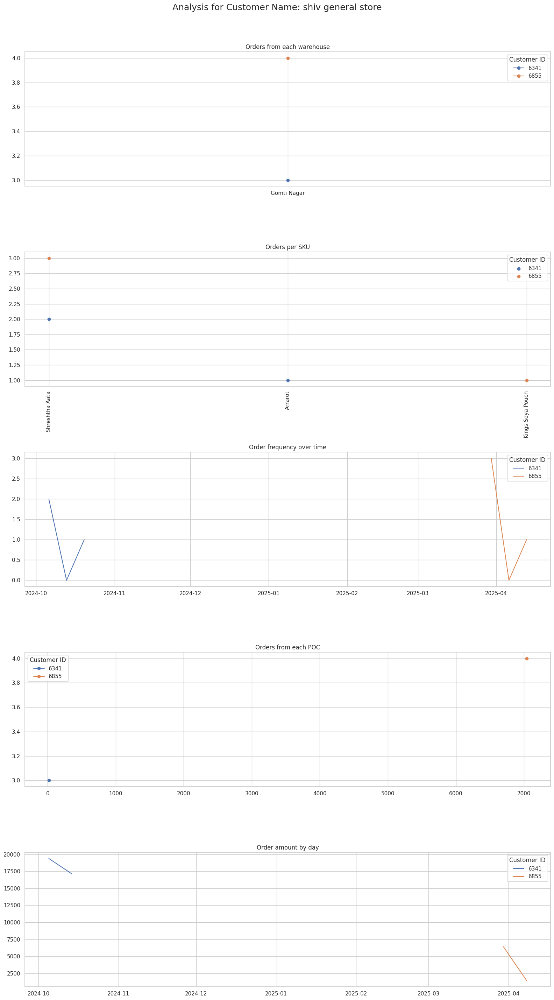

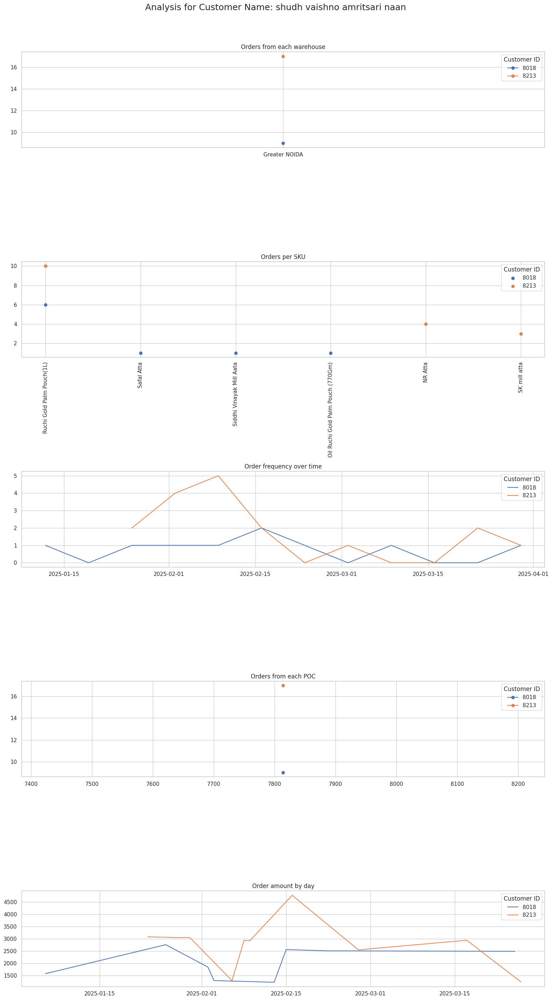

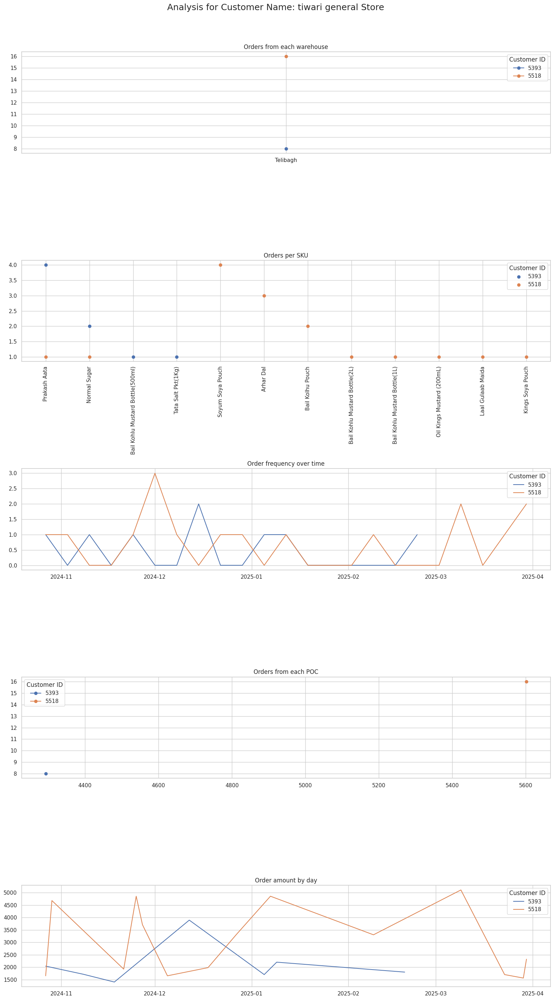

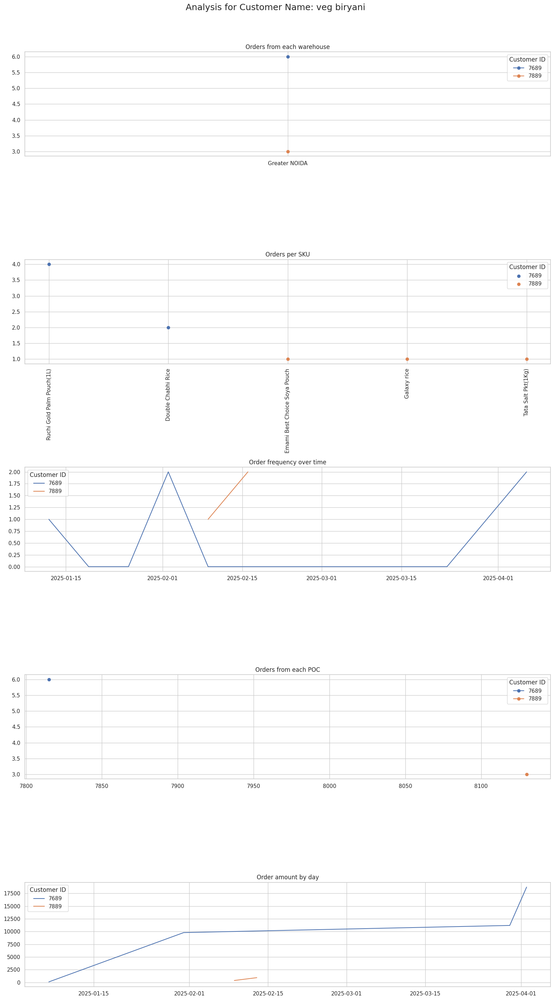

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify customer names linked to multiple customer IDs
duplicate_names = df_merged.groupby('customer_name')['customer_id'].nunique()
duplicate_names = duplicate_names[duplicate_names > 1]

# Loop over each customer name with multiple IDs
for customer_name in duplicate_names.index:
    customer_ids = df_merged[df_merged['customer_name'] == customer_name]['customer_id'].unique()
    
    sns.set(style='whitegrid')
    fig, axes = plt.subplots(5, 1, figsize=(16, 28))
    fig.suptitle(f"Analysis for Customer Name: {customer_name}", fontsize=18, y=1.02)

    for customer_id in customer_ids:
        cust_df = df_merged[df_merged['customer_id'] == customer_id]

        # 1. Orders from each warehouse
        warehouse_counts = cust_df['warehouse_name'].value_counts()
        axes[0].plot(warehouse_counts.index, warehouse_counts.values, marker='o', label=str(customer_id))

        # 2. Orders per SKU
        sku_counts = cust_df['item_name'].value_counts()
        axes[1].scatter(sku_counts.index, sku_counts.values, marker='o', label=str(customer_id))
        axes[1].tick_params(axis='x', labelrotation=90)

        # 3. Order frequency over time
        freq = cust_df.resample('W', on='order_date').size()
        axes[2].plot(freq.index, freq.values, label=str(customer_id))

        # 4. Orders from each POC
        poc_counts = cust_df['poc_id'].value_counts()
        axes[3].plot(poc_counts.index, poc_counts.values, marker='o', label=str(customer_id))

        # 5. Order amount by day
        amount_by_day = cust_df.groupby(cust_df['order_date'].dt.date)['amount'].sum()
        axes[4].plot(amount_by_day.index, amount_by_day.values, label=str(customer_id))

    # Set titles
    axes[0].set_title("Orders from each warehouse")
    axes[1].set_title("Orders per SKU")
    axes[2].set_title("Order frequency over time")
    axes[3].set_title("Orders from each POC")
    axes[4].set_title("Order amount by day")

    # Set legends
    for ax in axes:
        ax.legend(title="Customer ID")

    plt.tight_layout()
    plt.show()


In [16]:
# Find names linked to multiple unique customer IDs
duplicate_names = df_order.groupby('poc_name')['poc_id'].nunique()
duplicate_names = duplicate_names[duplicate_names > 1]

print("POC with same name but different IDs:")
print(duplicate_names)

POC with same name but different IDs:
poc_name
Harshit Shukla    2
Vikas Gupta       3
Name: poc_id, dtype: int64


In [17]:
df_associated_order

,order_id,order_number,order_item_id,item_name,quantity,invoiced_quantity,mrp,price_per_unit,amount,discount_amount,profit
0,104592,SO/24-25/85358,202967,Anannya Rice,2,2,1732.000,1534.0,3464.00,396.00,-208.00
1,74112,SO/24-25/55656,148560,Ambey Patent Maida,1,1,1899.000,1760.0,1899.00,139.00,-10.00
2,105873,SO/24-25/86555,205222,Arhar Dal,10,0,173.567,127.0,1735.67,465.67,-377.00
3,112302,SO/24-25/92717,216104,Kezar Maida,5,5,1760.000,1652.0,8800.00,540.00,-140.00
4,74308,SO/24-25/55887,148902,Normal Sugar,1,1,2190.000,2110.0,2190.00,80.00,40.00
...,...,...,...,...,...,...,...,...,...,...,...
115088,139435,SO/25-26/003737,262494,SAPNA GOLD AATA,2,0,2010.000,1470.0,4020.00,1080.00,-780.00
115089,139433,SO/25-26/003738,262491,Hum Tum Rice,5,0,1390.000,1215.0,6950.00,875.00,-375.00
115090,139431,SO/25-26/003739,262489,Masodha Double Filter Sugar,4,0,2430.000,2210.0,9720.00,880.00,-160.00
115091,139430,SO/25-26/003740,262488,Matar,10,0,54.675,45.0,546.75,96.75,-56.75


In [18]:
df_order.columns , df_associated_order.columns

(Index(['order_date', 'order_id', 'order_number', 'customer_id',
        'customer_name', 'poc_name', 'poc_id', 'amount', 'discount',
        'net_order_amount', 'profit', 'order_status', 'warehouse_name',
        'warehouse_id'],
       dtype='object'),
 Index(['order_id', 'order_number', 'order_item_id', 'item_name', 'quantity',
        'invoiced_quantity', 'mrp', 'price_per_unit', 'amount',
        'discount_amount', 'profit'],
       dtype='object'))

In [19]:
df_associated_order.nunique()

order_id              64459
order_number          64459
order_item_id        115093
item_name               607
quantity                117
invoiced_quantity       128
mrp                    1992
price_per_unit         2216
amount                 8264
discount_amount        6429
profit                 4614
dtype: int64

# Preprocessing the Order Dataset

In [20]:
df_order.describe()

,order_id,customer_id,poc_id,amount,discount,net_order_amount,profit,warehouse_id
count,64459.000000,64459.000000,64459.000000,6.445900e+04,64459.000000,64459.000000,64459.000000,64459.000000
mean,103426.837307,4386.190447,2920.965466,1.606811e+04,1350.906929,14717.198282,-308.391379,2.323043
std,20749.791913,2391.437029,3046.872786,3.308837e+04,3582.402681,30249.534820,1454.542967,1.348273
min,67415.000000,1.000000,2.000000,1.489000e+01,0.000000,14.890000,-86382.000000,1.000000
25%,85413.500000,2355.000000,35.000000,2.260000e+03,150.000000,2090.000000,-203.340000,1.000000
50%,103379.000000,4541.000000,52.000000,5.113970e+03,375.000000,4680.000000,-50.000000,2.000000
75%,121395.500000,6216.000000,5602.000000,1.565000e+04,1200.000000,14333.000000,-5.000000,3.000000
max,139441.000000,9367.000000,9555.000000,1.010000e+06,389858.000000,950000.000000,84750.000000,6.000000


In [21]:
df_order.nunique()

order_date            190
order_id            64459
order_number        64459
customer_id          4161
customer_name        4093
poc_name               94
poc_id                 97
amount              16440
discount             9525
net_order_amount    13168
profit               6643
order_status            2
warehouse_name          6
warehouse_id            6
dtype: int64

There are total of 64459 rows

Checking the Datatypes

In [22]:
df_order.dtypes

order_date           object
order_id              int64
order_number         object
customer_id           int64
customer_name        object
poc_name             object
poc_id                int64
amount              float64
discount            float64
net_order_amount    float64
profit              float64
order_status         object
warehouse_name       object
warehouse_id          int64
dtype: object

In [23]:
df_order['order_date'] = pd.to_datetime(df_order['order_date'], format="%d/%m/%Y")


Checking for the missing value in the Dataset

In [24]:
df_order.isnull().sum()


order_date          0
order_id            0
order_number        0
customer_id         0
customer_name       0
poc_name            0
poc_id              0
amount              0
discount            0
net_order_amount    0
profit              0
order_status        0
warehouse_name      0
warehouse_id        0
dtype: int64

No missing Values

# # Categorical Labeling the Order Status Column

0: CLOSED

1: OPEN

In [25]:
df_order['order_status'] = df_order['order_status'].str.lower().map({'open': 1, 'closed': 0})


Number of Order Open and Closed

In [26]:
df_order['order_status'].value_counts()

order_status
0    64317
1      142
Name: count, dtype: int64

In [27]:
df_order[['order_date', 'order_id', 'order_number']].head(20)


,order_date,order_id,order_number
0,2025-04-03,136349,SO/25-26/000818
1,2025-01-30,110393,SO/24-25/90881
2,2025-02-12,116427,SO/24-25/96511
3,2024-12-26,96182,SO/24-25/77411
4,2024-12-30,97858,SO/24-25/78975
5,2025-01-04,99588,SO/24-25/80618
6,2025-01-08,101333,SO/24-25/82271
7,2025-01-12,103091,SO/24-25/83927
8,2025-01-17,104851,SO/24-25/85612
9,2025-01-21,106675,SO/24-25/87331


Expanding the order number column

In [28]:
df_order['order_number'].value_counts()

order_number
SO/25-26/000818    1
SO/24-25/52316     1
SO/24-25/53405     1
SO/24-25/53764     1
SO/24-25/54219     1
                  ..
SO/24-25/107725    1
SO/24-25/109993    1
SO/24-25/79974     1
SO/24-25/81575     1
SO/24-25/77400     1
Name: count, Length: 64459, dtype: int64

In [29]:
df_order[['order_type', 'fiscal_year', 'order_sequence_num']] = df_order['order_number'].str.split('/', expand=True)

In [30]:
df_order.nunique()

order_date              190
order_id              64459
order_number          64459
customer_id            4161
customer_name          4093
poc_name                 94
poc_id                   97
amount                16440
discount               9525
net_order_amount      13168
profit                 6643
order_status              2
warehouse_name            6
warehouse_id              6
order_type                1
fiscal_year               2
order_sequence_num    64459
dtype: int64

In [31]:
df_order.dtypes

order_date            datetime64[ns]
order_id                       int64
order_number                  object
customer_id                    int64
customer_name                 object
poc_name                      object
poc_id                         int64
amount                       float64
discount                     float64
net_order_amount             float64
profit                       float64
order_status                   int64
warehouse_name                object
warehouse_id                   int64
order_type                    object
fiscal_year                   object
order_sequence_num            object
dtype: object

Droping unneccessary Columns

In [32]:
df_order.drop(columns = ['order_number', 'customer_name', 'poc_name', 'warehouse_name', 'order_type', 'order_sequence_num'], inplace = True)

Since, there are only 2 types of values in fiscal year, so we're converting it into a categorical data

In [33]:
df_order['fiscal_year'] = df_order['fiscal_year'].astype('category')

In [34]:
df_order

,order_date,order_id,customer_id,poc_id,amount,discount,net_order_amount,profit,order_status,warehouse_id,fiscal_year
0,2025-04-03,136349,5235,6,19125.00,1650.00,17475.0,0.0,0,3,25-26
1,2025-01-30,110393,7622,7814,9670.48,735.48,8935.0,-56.4,0,6,24-25
2,2025-02-12,116427,3827,51,62500.00,5000.00,57500.0,-650.0,0,3,24-25
3,2024-12-26,96182,2223,25,4520.00,420.00,4100.0,40.0,0,3,24-25
4,2024-12-30,97858,6903,7039,1700.00,0.00,1700.0,-88.0,0,1,24-25
...,...,...,...,...,...,...,...,...,...,...,...
64454,2024-12-26,96152,948,17,1650.00,130.00,1520.0,-60.0,0,1,24-25
64455,2024-12-26,96153,5822,5602,8255.00,935.00,7320.0,-455.0,0,2,24-25
64456,2024-12-25,96166,1655,37,20970.00,2140.00,18830.0,-195.0,0,3,24-25
64457,2024-12-26,96173,4268,4293,3508.00,198.00,3310.0,-30.0,0,2,24-25


In [35]:
print("Start date:", df_order['order_date'].min())
print('End Date:', df_order['order_date'].max())

Start date: 2024-09-30 00:00:00
End Date: 2025-04-10 00:00:00


In [36]:
df_order.fiscal_year.value_counts()

fiscal_year
24-25    60913
25-26     3546
Name: count, dtype: int64

In [37]:
from ydata_profiling import ProfileReport  # If using latest version of pandas-profiling

# Generate profile reports
profile_orders = ProfileReport(df_order, title="Orders Data Report", explorative=True)
# Save as HTML
profile_orders.to_file("df_orders_visualization.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 11/11 [00:00<00:00, 33.16it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing the Item Dataset

In [38]:
df_associated_order

,order_id,order_number,order_item_id,item_name,quantity,invoiced_quantity,mrp,price_per_unit,amount,discount_amount,profit
0,104592,SO/24-25/85358,202967,Anannya Rice,2,2,1732.000,1534.0,3464.00,396.00,-208.00
1,74112,SO/24-25/55656,148560,Ambey Patent Maida,1,1,1899.000,1760.0,1899.00,139.00,-10.00
2,105873,SO/24-25/86555,205222,Arhar Dal,10,0,173.567,127.0,1735.67,465.67,-377.00
3,112302,SO/24-25/92717,216104,Kezar Maida,5,5,1760.000,1652.0,8800.00,540.00,-140.00
4,74308,SO/24-25/55887,148902,Normal Sugar,1,1,2190.000,2110.0,2190.00,80.00,40.00
...,...,...,...,...,...,...,...,...,...,...,...
115088,139435,SO/25-26/003737,262494,SAPNA GOLD AATA,2,0,2010.000,1470.0,4020.00,1080.00,-780.00
115089,139433,SO/25-26/003738,262491,Hum Tum Rice,5,0,1390.000,1215.0,6950.00,875.00,-375.00
115090,139431,SO/25-26/003739,262489,Masodha Double Filter Sugar,4,0,2430.000,2210.0,9720.00,880.00,-160.00
115091,139430,SO/25-26/003740,262488,Matar,10,0,54.675,45.0,546.75,96.75,-56.75


In [39]:
df_associated_order.drop(columns = ['order_number'], inplace = True)

In [40]:
df_order_for_merge = df_order.drop(columns = ['amount', 'discount', 'net_order_amount', 'profit'])

In [41]:
df_order_for_merge

,order_date,order_id,customer_id,poc_id,order_status,warehouse_id,fiscal_year
0,2025-04-03,136349,5235,6,0,3,25-26
1,2025-01-30,110393,7622,7814,0,6,24-25
2,2025-02-12,116427,3827,51,0,3,24-25
3,2024-12-26,96182,2223,25,0,3,24-25
4,2024-12-30,97858,6903,7039,0,1,24-25
...,...,...,...,...,...,...,...
64454,2024-12-26,96152,948,17,0,1,24-25
64455,2024-12-26,96153,5822,5602,0,2,24-25
64456,2024-12-25,96166,1655,37,0,3,24-25
64457,2024-12-26,96173,4268,4293,0,2,24-25


In [42]:
df_associated_order

,order_id,order_item_id,item_name,quantity,invoiced_quantity,mrp,price_per_unit,amount,discount_amount,profit
0,104592,202967,Anannya Rice,2,2,1732.000,1534.0,3464.00,396.00,-208.00
1,74112,148560,Ambey Patent Maida,1,1,1899.000,1760.0,1899.00,139.00,-10.00
2,105873,205222,Arhar Dal,10,0,173.567,127.0,1735.67,465.67,-377.00
3,112302,216104,Kezar Maida,5,5,1760.000,1652.0,8800.00,540.00,-140.00
4,74308,148902,Normal Sugar,1,1,2190.000,2110.0,2190.00,80.00,40.00
...,...,...,...,...,...,...,...,...,...,...
115088,139435,262494,SAPNA GOLD AATA,2,0,2010.000,1470.0,4020.00,1080.00,-780.00
115089,139433,262491,Hum Tum Rice,5,0,1390.000,1215.0,6950.00,875.00,-375.00
115090,139431,262489,Masodha Double Filter Sugar,4,0,2430.000,2210.0,9720.00,880.00,-160.00
115091,139430,262488,Matar,10,0,54.675,45.0,546.75,96.75,-56.75


In [43]:
df_final = result = pd.merge(df_associated_order, df_order_for_merge, on='order_id', how='inner')

In [44]:
df_final

,order_id,order_item_id,item_name,quantity,invoiced_quantity,mrp,price_per_unit,amount,discount_amount,profit,order_date,customer_id,poc_id,order_status,warehouse_id,fiscal_year
0,104592,202967,Anannya Rice,2,2,1732.000,1534.0,3464.00,396.00,-208.00,2025-01-16,5980,5381,0,2,24-25
1,74112,148560,Ambey Patent Maida,1,1,1899.000,1760.0,1899.00,139.00,-10.00,2024-10-22,5540,4680,0,3,24-25
2,105873,205222,Arhar Dal,10,0,173.567,127.0,1735.67,465.67,-377.00,2025-01-19,1119,5381,0,2,24-25
3,112302,216104,Kezar Maida,5,5,1760.000,1652.0,8800.00,540.00,-140.00,2025-02-04,3776,43,0,1,24-25
4,74308,148902,Normal Sugar,1,1,2190.000,2110.0,2190.00,80.00,40.00,2024-10-22,5569,5602,0,2,24-25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115088,139435,262494,SAPNA GOLD AATA,2,0,2010.000,1470.0,4020.00,1080.00,-780.00,2025-04-10,7869,7228,1,4,25-26
115089,139433,262491,Hum Tum Rice,5,0,1390.000,1215.0,6950.00,875.00,-375.00,2025-04-10,7806,7228,1,4,25-26
115090,139431,262489,Masodha Double Filter Sugar,4,0,2430.000,2210.0,9720.00,880.00,-160.00,2025-04-10,7806,7228,1,4,25-26
115091,139430,262488,Matar,10,0,54.675,45.0,546.75,96.75,-56.75,2025-04-10,4982,7228,1,4,25-26


In [45]:
df_final.to_csv('merge_final.csv', index=False)

In [46]:
from ydata_profiling import ProfileReport  # If using latest version of pandas-profiling

# Generate profile reports
profile_final = ProfileReport(df_final, title="Orders Data Report", explorative=True)
# Save as HTML
profile_final.to_file("df_final_visualization.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:01<00:00, 14.14it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [47]:
print('The total number of unique customer: ',(df_final.customer_id.nunique()))

The total number of unique customer:  4161


In [48]:
df_final.nunique()

order_id              64459
order_item_id        115093
item_name               607
quantity                117
invoiced_quantity       128
mrp                    1992
price_per_unit         2216
amount                 8264
discount_amount        6429
profit                 4614
order_date              190
customer_id            4161
poc_id                   97
order_status              2
warehouse_id              6
fiscal_year               2
dtype: int64

In [49]:
df_final['sales_amount'] = df_final['amount']	- df_final['discount_amount']

In [50]:
df_final.sales_amount.sum()

948639674.0799999

In [51]:
df_final.item_name.value_counts()

item_name
Ruchi Gold Palm Pouch(1L)    6945
Normal Sugar                 6233
Prakash Maida                4952
Prakash Aata                 4779
Shreshtha Aata               4739
                             ... 
RAAGI                           1
Haldi Pkt(1kg)                  1
Kishu Mini Mogra Rice           1
Gari Burada                     1
Agro Chana Besan Mahin          1
Name: count, Length: 607, dtype: int64

In [52]:
df_final.item_name.unique()

array(['Anannya Rice', 'Ambey Patent Maida', 'Arhar Dal', 'Kezar Maida',
       'Normal Sugar', 'Prakash Aata', 'Prakash Maida', 'Matar',
       'DCM Double Filter Sugar', 'Tata Salt Pkt(1Kg)',
       'Adani Patla Besan', 'Ashok Kali Mirch Powder (50 Gm)',
       'Kezar Aata', 'SODA CHINI (1KG) सोडा', 'Soyum Soya Pouch',
       'Sunny Maida', 'Rice MV Gold', 'Shreshtha Aata',
       'Nourish Sunflower Pouch', 'Bail Kolhu Pouch', 'Arrarot',
       'Swastik maida', 'Fortune Soya Pouch(1L)', 'Steam Rice',
       'Swastik Suji Rava', 'Ruchi Gold Palm Pouch(1L)', 'Medium Chhola',
       'Laal Mirch Sabut', 'Ganesh Maida', 'Shri Ram maida (50kg)',
       'Rajdhani Chakki aata', 'Rajdhani Maida', 'Pani (500 Ml)',
       'Pukhraj Arhar Dal', 'Parivar Pasand Chakki Aata (50kg)',
       'Soyum Soya (15Lit)', 'Laal Gulaab Maida', 'SAPNA GOLD MAIDA',
       'Chana Dal', 'Adani Mota Besan', 'Fryola Palm', 'Kaali Masoor Dal',
       'Aashirwad Chakki Atta (10kg)', 'Safal Atta',
       'Nature Fresh 

In [53]:
((df_final.mrp - df_final.price_per_unit) * 100 / df_final.price_per_unit).mean()

10.57309479672752